# Load packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import scipy as sp
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import silhouette_score
import os

# Load MERFISH object

In [2]:
adata_merfish = sc.read_h5ad('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/scanpy_obj/merfish_w12_merged_4C4_4C12_4C15.h5ad')

In [6]:
adata_merfish.obs

,sample_id,batch,n_counts,leiden,celltype,filter
6-R77_4C4,R77_4C4,R77_4C4,86.0,6,VIC,black
8-R77_4C4,R77_4C4,R77_4C4,148.0,6,VIC,black
9-R77_4C4,R77_4C4,R77_4C4,100.0,6,VIC,black
10-R77_4C4,R77_4C4,R77_4C4,70.0,6,VIC,black
12-R77_4C4,R77_4C4,R77_4C4,63.0,6,VIC,black
...,...,...,...,...,...,...
6660345-R78_4C15,R78_4C15,R78_4C15,70.0,6,VIC,black
6660348-R78_4C15,R78_4C15,R78_4C15,83.0,24,VEC,black
6660352-R78_4C15,R78_4C15,R78_4C15,70.0,24,VEC,black
6660357-R78_4C15,R78_4C15,R78_4C15,118.0,6,VIC,black


(array([1.7438e+04, 3.8890e+04, 4.3701e+04, 3.8959e+04, 3.0081e+04,
        2.1057e+04, 1.4185e+04, 9.0080e+03, 5.7750e+03, 3.5890e+03,
        2.1800e+03, 1.4500e+03, 8.7200e+02, 5.4100e+02, 3.3500e+02,
        1.9800e+02, 1.2900e+02, 1.0100e+02, 5.2000e+01, 3.2000e+01,
        1.8000e+01, 1.8000e+01, 9.0000e+00, 7.0000e+00, 2.0000e+00,
        2.0000e+00, 2.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        2.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([   9.  ,  121.78,  234.56,  347.34,  460.12,  572.9 ,  685.68,
         798.46,  911.24, 1024.02, 1136.8 , 1249.58, 1362.36, 1475.14,
        1587.92, 1700.7 , 1813.48, 1926.26, 2039.04, 2151.82, 2264.6 ,
        2377.38, 2490.16, 2602.94, 2715.72, 2828.5 , 2941.28, 3054.06,
        3166.84, 3279.62, 3392.4 ,

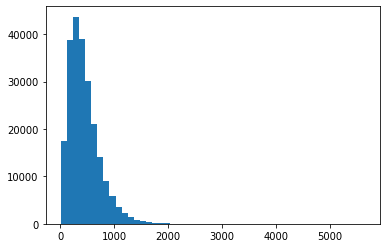

In [4]:
plt.hist(adata_merfish.obs['n_counts'], bins=50)

# Community identification

## Calculate 'zone' cell type counts

In [31]:
celltype_key = 'celltype'
# for radius in [25,50,75,100,125,150,175,200,225,250,275,300]:
for radius in [100,125,150,175,200,225,250,275,300]:
# for radius in [150]:
    print(radius)
    
    # sample = 'R77_4C4'
    for sample in ['R77_4C4','R78_4C12','R78_4C15']:
        print(sample)

        # subset to a section, find
        adata_merfish_section = adata_merfish[adata_merfish.obs['sample_id']==sample]
        # find the neighboring cells in the 'zone' around each cell
        point_tree = sp.spatial.cKDTree(adata_merfish_section.obsm['spatial'])
        neigh_inds_list = point_tree.query_ball_point(adata_merfish_section.obsm['spatial'], radius)
        neigh_celltype_df = pd.DataFrame(adata_merfish_section.obs[celltype_key][neigh_inds_list[0]].value_counts())
            
        # quantify the proportion of cell type in each zone
        neigh_celltype_list = []
        for i in tqdm(range(len(neigh_inds_list))):
            neigh_inds = neigh_inds_list[i]
            celltype_counts = pd.DataFrame(adata_merfish_section.obs[celltype_key][neigh_inds].value_counts())
            neigh_celltype_list.append(celltype_counts)
        neigh_celltype_df = pd.concat(neigh_celltype_list, axis=1)
            
        neigh_celltype_df.columns = adata_merfish_section.obs.index
        neigh_celltype_df = neigh_celltype_df.T
        
        neigh_celltype_df = neigh_celltype_df.fillna(0.0).astype('int')
    
        # write 'zone' cell type counts to file
        neigh_celltype_df.to_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/' + sample + '/merfish_neigh_' + celltype_key +'_counts_radius_' + str(radius) + '.csv')

100
R77_4C4


100%|██████████| 72962/72962 [01:12<00:00, 1007.33it/s]


R78_4C12


100%|██████████| 75782/75782 [01:15<00:00, 1006.91it/s]


R78_4C15


100%|██████████| 79891/79891 [01:18<00:00, 1014.18it/s]


125
R77_4C4


100%|██████████| 72962/72962 [01:13<00:00, 990.21it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:16<00:00, 992.84it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:20<00:00, 993.34it/s] 


150
R77_4C4


100%|██████████| 72962/72962 [01:13<00:00, 991.35it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:16<00:00, 984.74it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:20<00:00, 998.07it/s] 


175
R77_4C4


100%|██████████| 72962/72962 [01:13<00:00, 998.66it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:16<00:00, 985.69it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:21<00:00, 979.32it/s] 


200
R77_4C4


  1%|          | 500/72962 [00:00<01:14, 966.66it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 79891/79891 [01:21<00:00, 974.62it/s] 


225
R77_4C4


100%|██████████| 72962/72962 [01:14<00:00, 983.74it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:18<00:00, 965.58it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:22<00:00, 966.50it/s] 


250
R77_4C4


100%|██████████| 72962/72962 [01:17<00:00, 943.14it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:20<00:00, 942.83it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:24<00:00, 942.78it/s] 


275
R77_4C4


100%|██████████| 72962/72962 [01:19<00:00, 912.85it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:21<00:00, 931.11it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:29<00:00, 889.11it/s] 


300
R77_4C4


100%|██████████| 72962/72962 [01:20<00:00, 905.02it/s] 


R78_4C12


100%|██████████| 75782/75782 [01:25<00:00, 889.10it/s] 


R78_4C15


100%|██████████| 79891/79891 [01:28<00:00, 899.76it/s] 


## Choosing number of clusters

In [3]:
radius = 150

neigh_celltype_df = pd.read_csv('../data/MERFISH/zone_counts/R77_4C4/merfish_neigh_celltype_counts_radius_' + str(radius) + '.csv', index_col=0)
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('../data/MERFISH/zone_counts/R78_4C12/merfish_neigh_celltype_counts_radius_' + str(radius) + '.csv', index_col=0))
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('../data/MERFISH/zone_counts/R78_4C15/merfish_neigh_celltype_counts_radius_' + str(radius) + '.csv', index_col=0))
neigh_celltype_df.index = neigh_celltype_df.index.astype('str')
sil_score_dict = {}

for k in tqdm([2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(neigh_celltype_df)
    score = silhouette_score(X = neigh_celltype_df.to_numpy(),
                             sample_size = 50000,
                             labels = kmeans.labels_.astype('str'))
    sil_score_dict[k] = score

100%|██████████| 14/14 [08:03<00:00, 34.56s/it]


<ipython-input-19-1ceb6725092f>:4: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=None)


[Text(0, 0.5, 'Average silhoute score')]

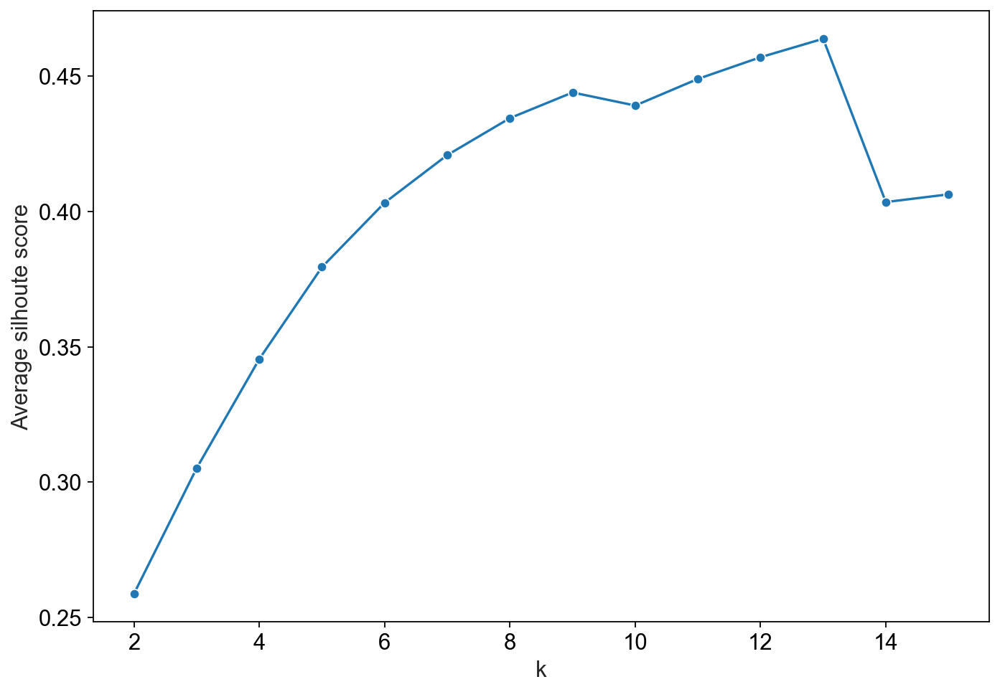

In [19]:
sil_score_df = pd.DataFrame({'k':list(sil_score_dict.keys()), 'sil_score':list(sil_score_dict.values())})
sns.set_style("ticks")
sc.set_figure_params(figsize=[10,7])
plt.grid(b=None)
g = sns.lineplot(data=sil_score_df, x="k", y="sil_score", marker="o")
g.set(ylabel = "Average silhoute score")
plt.savefig('/volume/Notebooks/sil_score.pdf', bbox_inches='tight')

## Cluster 'zones'

In [2]:
radius = 150
celltype_key = 'celltype'

# Read in 'zone' cell type counts for each section
neigh_celltype_df = pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R77_4C4/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0)
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R78_4C12/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0))
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R78_4C15/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0))

# Scale cell type counts for each 'zone'
neigh_celltype_df = pd.DataFrame(StandardScaler().fit_transform(neigh_celltype_df),
                                 index = neigh_celltype_df.index,
                                 columns = neigh_celltype_df.columns)

neigh_celltype_df.columns = neigh_celltype_df.columns.astype(str)

In [6]:
# K-means cluster 'zone' cell type proportions
k = 13
kmeans = KMeans(n_clusters=k, random_state=0).fit(neigh_celltype_df)

adata_merfish.obs.loc[neigh_celltype_df.index,'zone_cluster'] = kmeans.labels_.astype('str')

... storing 'zone_cluster' as categorical


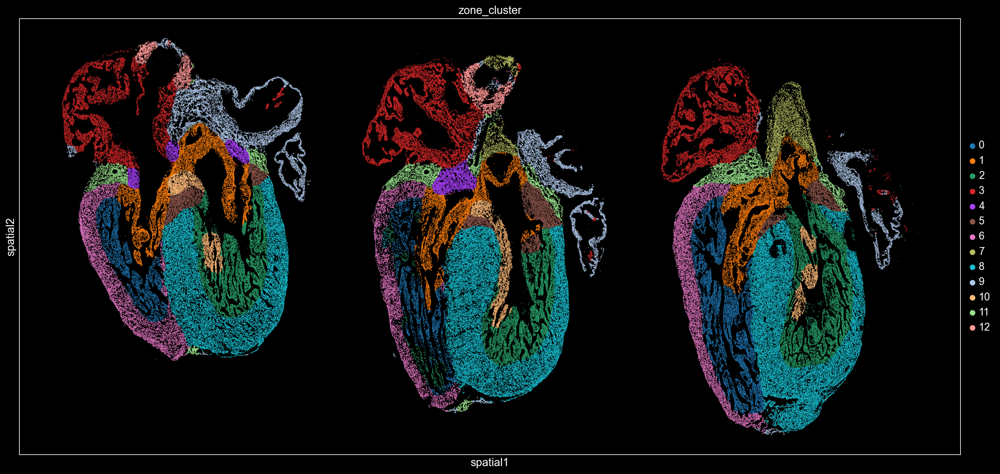

In [7]:
# Plot zone clusters spatially
sc.set_figure_params(figsize=[21,10])
plt.style.use('dark_background')
sc.pl.embedding(adata_merfish, basis="spatial", color="zone_cluster", size=3)
plt.style.use('default')

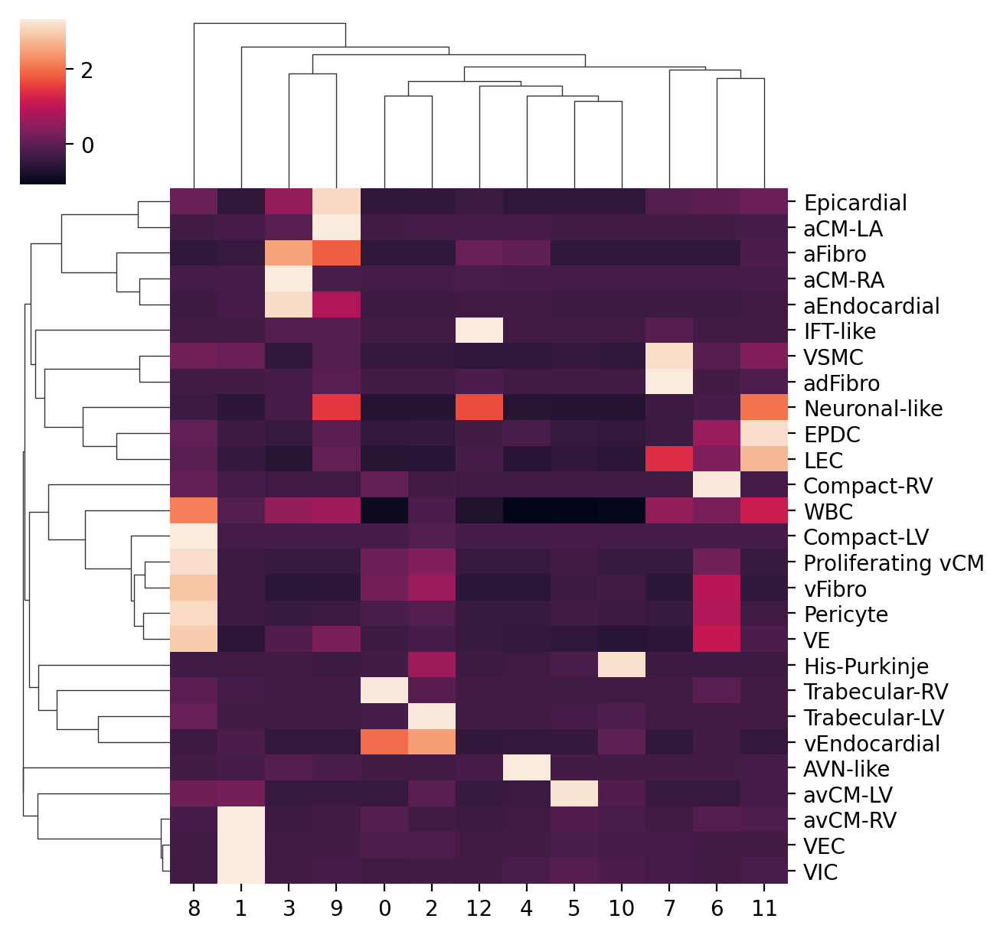

In [8]:
# Generate a heatmap to visualize the cell type contribution for each cluster
df = adata_merfish.obs.groupby([celltype_key,'zone_cluster']).size().unstack(fill_value=0).to_numpy()
plot_df = pd.DataFrame(df, 
                       index=adata_merfish.obs[celltype_key].cat.categories, 
                       columns=adata_merfish.obs['zone_cluster'].cat.categories)
plot_df_norm_row = plot_df.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
g = sns.clustermap(plot_df_norm_row)
g.fig.set_size_inches(6,6)

## Annotate clusters

In [14]:
# annotate clusters (CHANGE CLUSTER MAPPING)
zone_cluster_annotations = {'0':'Inner-RV', '1':'Valve', '2':'Inner-LV', '3':'Right Atria', 
                           '4':'AVN/AV Ring-like', '5':'Papillary Muscle-LV', '6':'Outer-RV', '7':'OFT', 
                           '8':'Outer-LV', '9':'Left Atria', '10':'His-Purkinje', '11':'Subepicardial', '12':'IFT/SAN'}
adata_merfish.obs['communities'] = adata_merfish.obs['zone_cluster'].replace(zone_cluster_annotations)

In [21]:
# Specify community colors
community_color = {'AVN/AV Ring-like':'#007ABA', 'Outer-LV':'#F37121', 'Outer-RV':'#FBB36E', 
                   'OFT':'#925047', 'Papillary Muscle-LV':'#F58D93', 'His-Purkinje':'#8B58A4', 
                   'IFT/SAN':'#DF75AE', 'Left Atria':'#E91E25', 'Right Atria':'#B4BE50', 
                   'Subepicardial':'#00A163', 'Inner-LV':'#00B7CA', 'Inner-RV':'#A8C7E9', 
                   'Valve':'#8CCA7C'}

adata_merfish.uns['communities_colors'] = [community_color[community] for community in np.sort(adata_merfish.obs['communities'].unique())]

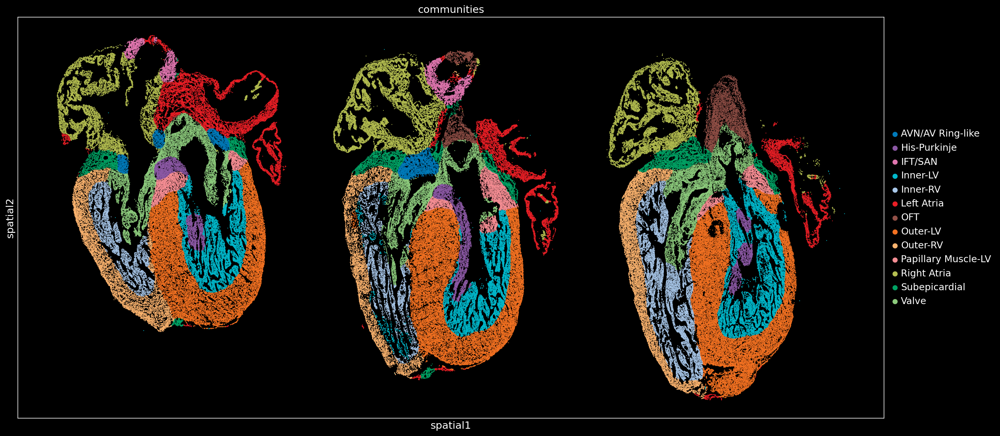

In [24]:
sc.set_figure_params(figsize=[21,10])
plt.style.use('dark_background')
p = sc.pl.embedding(adata_merfish, basis="spatial", color="communities", size=5, return_fig=True)
p.savefig('../figures/Fig2/MERFISH_spatial_communities.pdf', bbox_inches='tight')
plt.style.use('default')

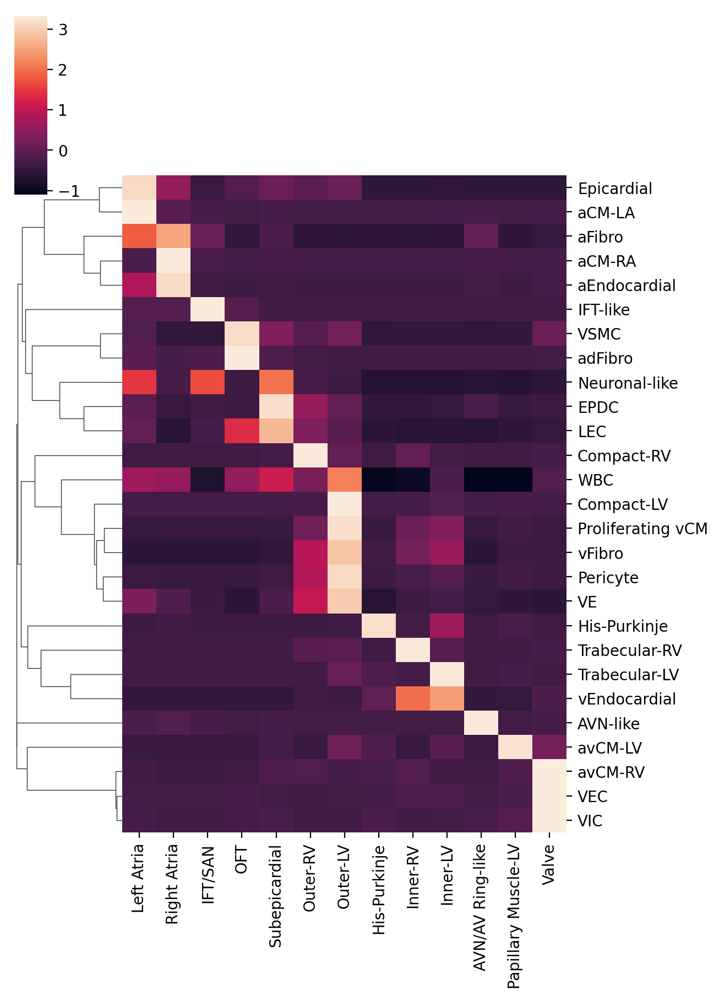

In [26]:
celltype_key = 'celltype'
df = adata_merfish.obs.groupby([celltype_key,'communities']).size().unstack(fill_value=0).to_numpy()
plot_df = pd.DataFrame(df, 
                       index=adata_merfish.obs[celltype_key].cat.categories, 
                       columns=adata_merfish.obs['communities'].cat.categories)
com_order = ['Left Atria','Right Atria','IFT/SAN','OFT','Subepicardial','Outer-RV',
             'Outer-LV','His-Purkinje','Inner-RV','Inner-LV','AVN/AV Ring-like',
             'Papillary Muscle-LV','Valve']
plot_df = plot_df.loc[:,com_order]
plot_df_norm_row = plot_df.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
g = sns.clustermap(plot_df_norm_row, col_cluster=False)
g.fig.set_size_inches(6,9)
g.savefig('../figures/Fig2/MERFISH_community_celltype_prop_heatmap.pdf', bbox_inches='tight')

# Complexity analysis

## Calculate 'zone' complexities

Complexity is the number of unique cell types in the 'zone' around each cell.

In [27]:
radius = 150
celltype_key = 'celltype'

# Read in 'zone' cell type counts for each section
neigh_celltype_df = pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R77_4C4/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0)
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R78_4C12/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0))
neigh_celltype_df = neigh_celltype_df.append(pd.read_csv('/volume/Projects/Heart_MERFISH_analysis/data/MERFISH/zone_counts/R78_4C15/merfish_neigh_' + celltype_key + '_counts_radius_' + str(radius) + '.csv', index_col=0))

neigh_celltype_df.columns = neigh_celltype_df.columns.astype(str)

# Calculate 'zone' complixities
neigh_celltype_df['complexity'] = neigh_celltype_df.astype(bool).sum(axis=1)
adata_merfish.obs['complexity'] = neigh_celltype_df.loc[adata_merfish.obs.index,'complexity']

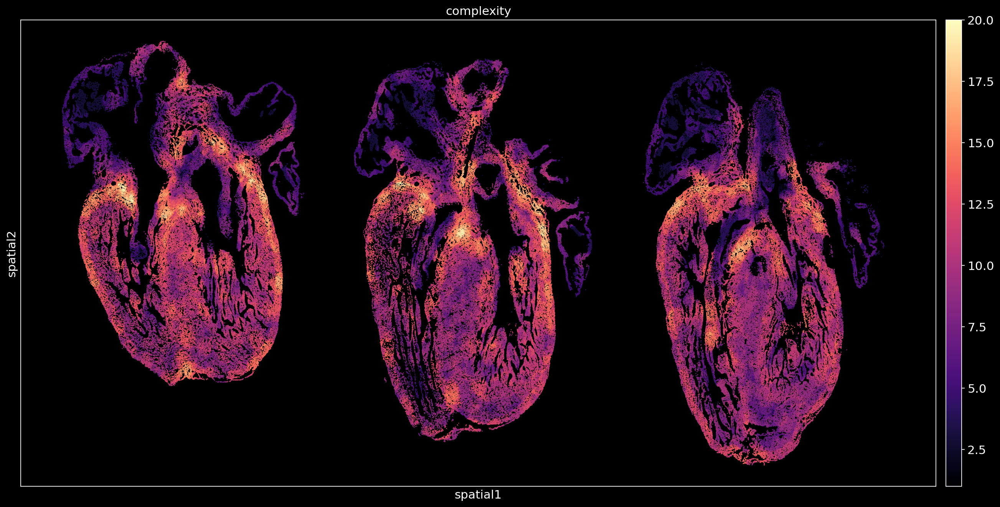

In [28]:
sc.set_figure_params(figsize=[21,10])
plt.style.use('dark_background')
p = sc.pl.embedding(adata_merfish, basis="spatial", color="complexity", size=5, color_map='magma', return_fig=True)
p.savefig('../figures/Fig2/MERFISH_spatial_complexity.pdf', bbox_inches='tight')
plt.style.use('default')

## Calculate community complexity

Redo 'zone' complexity calculations as to not consider any cells not in a given community.

In [31]:
celltype_key = 'celltype'
radius = 150

neigh_celltype_com_list = []
for community in adata_merfish.obs['communities'].cat.categories:
    print(community)
    
    adata_merfish_com = adata_merfish[adata_merfish.obs['communities']==community]
    point_tree = sp.spatial.cKDTree(adata_merfish_com.obsm['spatial'])
    neigh_inds_list = point_tree.query_ball_point(adata_merfish_com.obsm['spatial'], radius)
    neigh_celltype_df = pd.DataFrame(adata_merfish_com.obs[celltype_key][neigh_inds_list[0]].value_counts())
    
    neigh_celltype_list = []
    for i in tqdm(range(len(neigh_inds_list))):
        neigh_inds = neigh_inds_list[i]
        celltype_counts = pd.DataFrame(adata_merfish_com.obs[celltype_key][neigh_inds].value_counts())
        neigh_celltype_list.append(celltype_counts)
    neigh_celltype_com_df = pd.concat(neigh_celltype_list, axis=1)
    
    neigh_celltype_com_df.columns = adata_merfish_com.obs.index
    neigh_celltype_com_df = neigh_celltype_com_df.T

    neigh_celltype_com_df.columns = neigh_celltype_com_df.columns.astype('str')
    neigh_celltype_com_list.append(neigh_celltype_com_df)
    
neigh_celltype_df = pd.concat(neigh_celltype_com_list)
neigh_celltype_df = neigh_celltype_df.fillna(0.0).astype('int')

neigh_celltype_df['community'] = adata_merfish.obs.loc[neigh_celltype_df.index, 'communities']

AVN/AV Ring-like


100%|██████████| 4003/4003 [00:04<00:00, 976.50it/s] 


His-Purkinje


100%|██████████| 6956/6956 [00:07<00:00, 977.11it/s] 


IFT/SAN


100%|██████████| 3791/3791 [00:03<00:00, 1013.61it/s]


Inner-LV


100%|██████████| 28263/28263 [00:28<00:00, 979.64it/s] 


Inner-RV


100%|██████████| 16369/16369 [00:16<00:00, 1002.17it/s]


Left Atria


100%|██████████| 17940/17940 [00:18<00:00, 990.05it/s] 


OFT


100%|██████████| 5135/5135 [00:05<00:00, 962.13it/s] 


Outer-LV


100%|██████████| 60810/60810 [01:02<00:00, 969.58it/s] 


Outer-RV


100%|██████████| 19901/19901 [00:20<00:00, 994.38it/s] 


Papillary Muscle-LV


100%|██████████| 7661/7661 [00:07<00:00, 1005.44it/s]


Right Atria


100%|██████████| 27613/27613 [00:27<00:00, 990.58it/s] 


Subepicardial


100%|██████████| 9106/9106 [00:08<00:00, 1018.23it/s]


Valve


100%|██████████| 21087/21087 [00:21<00:00, 986.42it/s] 


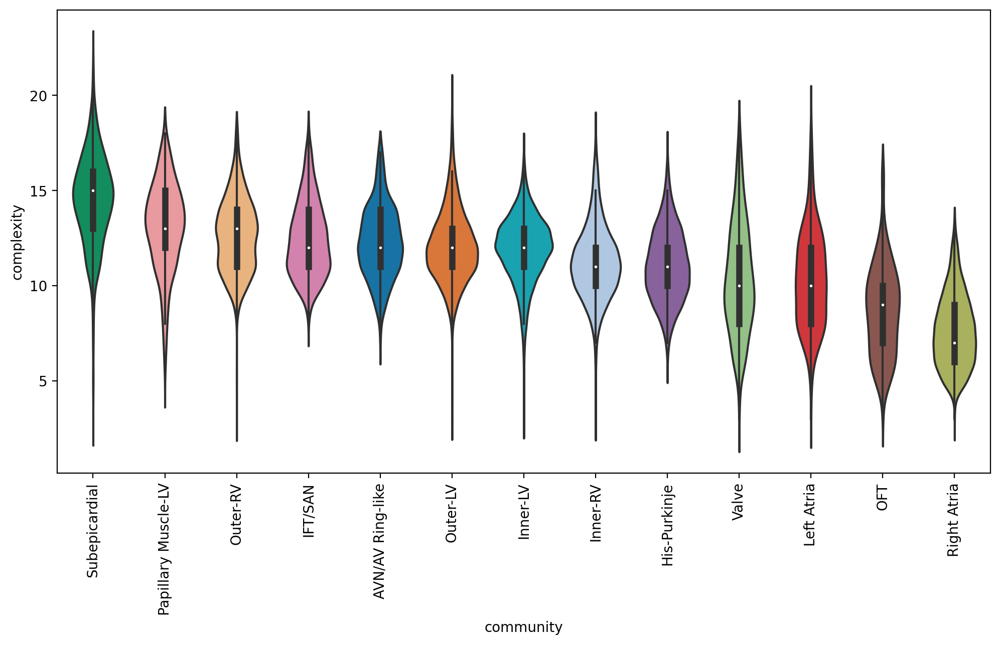

In [39]:
data = neigh_celltype_df
data.columns = data.columns.astype('str')
data['complexity'] = data.astype(bool).sum(axis=1)
com_order = data.groupby(['community'])['complexity'].mean().reset_index().sort_values('complexity', ascending=False)['community'].to_list()
data['community'] = pd.Categorical(data['community'], categories=com_order)

plt.figure(figsize = (12,6))
sns.violinplot(x="community", y="complexity", data=data, bw=.3, palette=community_color)
plt.xticks(rotation=90)
plt.savefig('../figures/Fig2/MERFISH_community_complexity_violin.pdf', bbox_inches='tight')